## Blue Book for Bulldozers

### The Kaggle competition expects participants to predict sale price of bull dozers.






In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
from pandas.plotting import scatter_matrix
from sklearn import preprocessing, metrics
import category_encoders as ce

from xgboost import XGBRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, make_scorer

import warnings

warnings.filterwarnings("ignore")


In [148]:
# Read files 
df_train = pd.read_csv('TrainAndValid.csv')
df_valid = pd.read_csv('Valid.csv')
y_valid = pd.read_csv('ValidSolution.csv').SalePrice
df_test = pd.read_csv('Test.csv')

# Train data contains both train and valid set. Exclude valid set from train set. 
df_train = df_train[~df_train.SalesID.isin(df_valid.SalesID)]

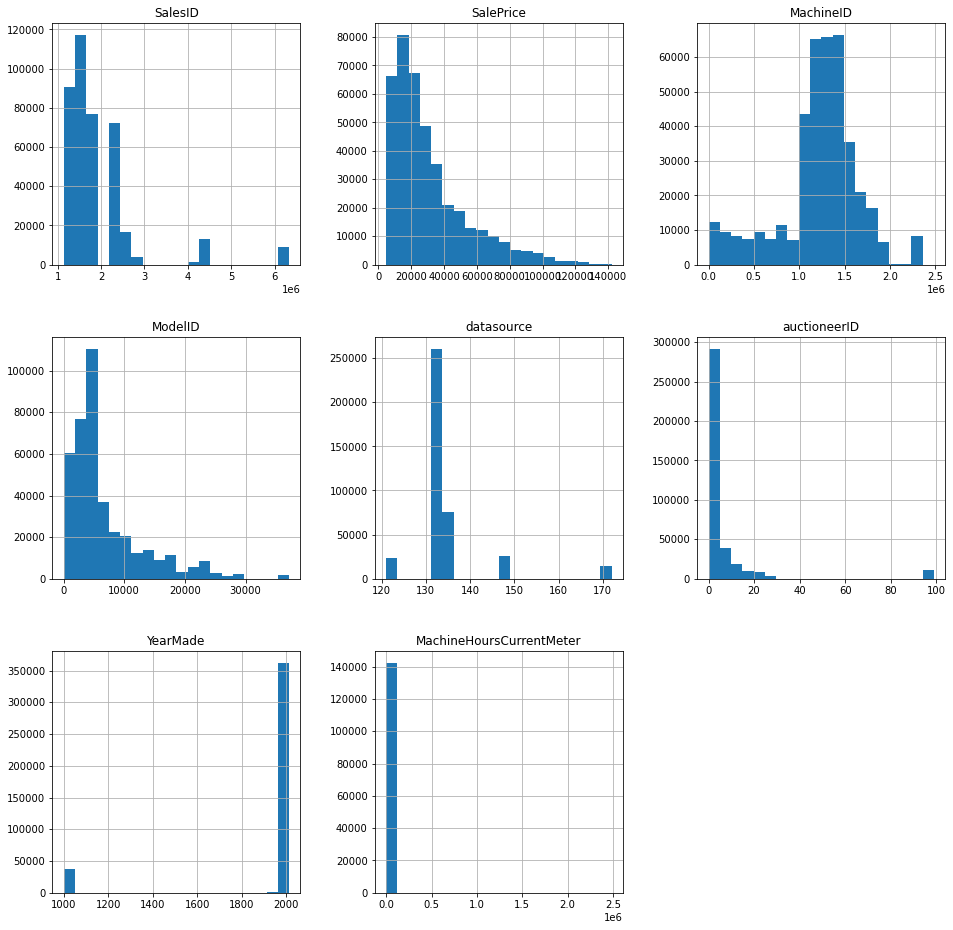

In [149]:
"""
Basic Data Validity Check
"""
# Numerical columns 
num_cols = [col for col in df_train.columns if df_train[col].dtype in ['int64','float64']]

ax = df_train[num_cols].hist(figsize=(16,16), bins=20)    
plt.show()

We see that some of the bulldozers have YearMade = 1000. We should replace it with other values. Moreover, we can see that SalesID and MachineID are mostly unique. Drop these two columns.

In [150]:
"""
Preprocessing & Feature Engineering Functions
"""

def remove_ids(df):
    df.drop(['SalesID','MachineID'], axis=1, inplace=True)
    
    return df

def update_yearmade(df):
    df.loc[df['YearMade'] < 1940, 'YearMade'] = np.nan
    
    return df
    
def update_nan(df):
    df.replace('None or Unspecified', np.nan, inplace=True)
    
    return df

# Add sale year and month column
def update_saledate(df):
    df['saledate'] = pd.to_datetime(df['saledate'], infer_datetime_format=True)
    df['SaleYear'] = df['saledate'].dt.year 
    df['SaleMonth'] = df['saledate'].dt.month
    df.drop('saledate', axis=1, inplace=True)
    
    return df 

# Add how old the machine is
def add_own_period(df):
    df['OwnPeriod'] = df['SaleYear'] - df['YearMade']
    
    return df 

In [151]:

# Find out the proportion of missing values in its column
prop = df_train.isna().sum() / len(df_train)

# More than 80% missing
high_missing_cols = df_train[list(prop[prop > 0.8].index)].columns

# Categorical columns with more than 10 unique values 
cat_cols = [col for col in df_train.columns if df_train[col].dtype == 'O' and df_train[col].nunique() > 10]

# see categorical columns that are more than 70% missing and yet have more than 10 distinct values
remove_cols = list(set(cat_cols) & set(high_missing_cols))


We will be removing these columns

In [152]:
list_df = [df_train, df_valid, df_test]

for df in list_df:     
    df.drop(remove_cols, axis=1, inplace=True)
    df.pipe(remove_ids).pipe(update_yearmade).pipe(update_nan).pipe(update_saledate)

# EDA
* Try to find distribution of our data
* EDA will be continued later after some of the values are imputed

<AxesSubplot:>

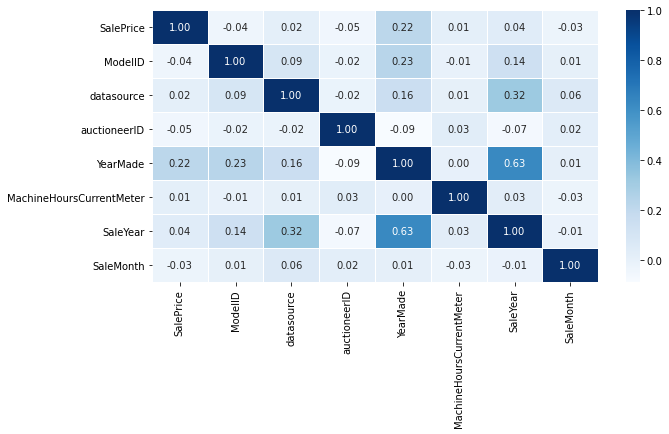

In [153]:
# Plot correlation matrix
plt.figure(figsize=(10,5))
sns.heatmap(data = df_train.corr(), annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')

Except for the YearMade and OwnPeriod column, all numerical columns don't display particular correlation with respect to the Sale Price.

array([[<AxesSubplot:xlabel='SalePrice', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='ModelID', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='datasource', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='auctioneerID', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='YearMade', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='MachineHoursCurrentMeter', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='SaleYear', ylabel='SalePrice'>,
        <AxesSubplot:xlabel='SaleMonth', ylabel='SalePrice'>],
       [<AxesSubplot:xlabel='SalePrice', ylabel='ModelID'>,
        <AxesSubplot:xlabel='ModelID', ylabel='ModelID'>,
        <AxesSubplot:xlabel='datasource', ylabel='ModelID'>,
        <AxesSubplot:xlabel='auctioneerID', ylabel='ModelID'>,
        <AxesSubplot:xlabel='YearMade', ylabel='ModelID'>,
        <AxesSubplot:xlabel='MachineHoursCurrentMeter', ylabel='ModelID'>,
        <AxesSubplot:xlabel='SaleYear', ylabel='ModelID'>,
        <AxesSubplot:xlabel='SaleMonth', ylabel='Mode

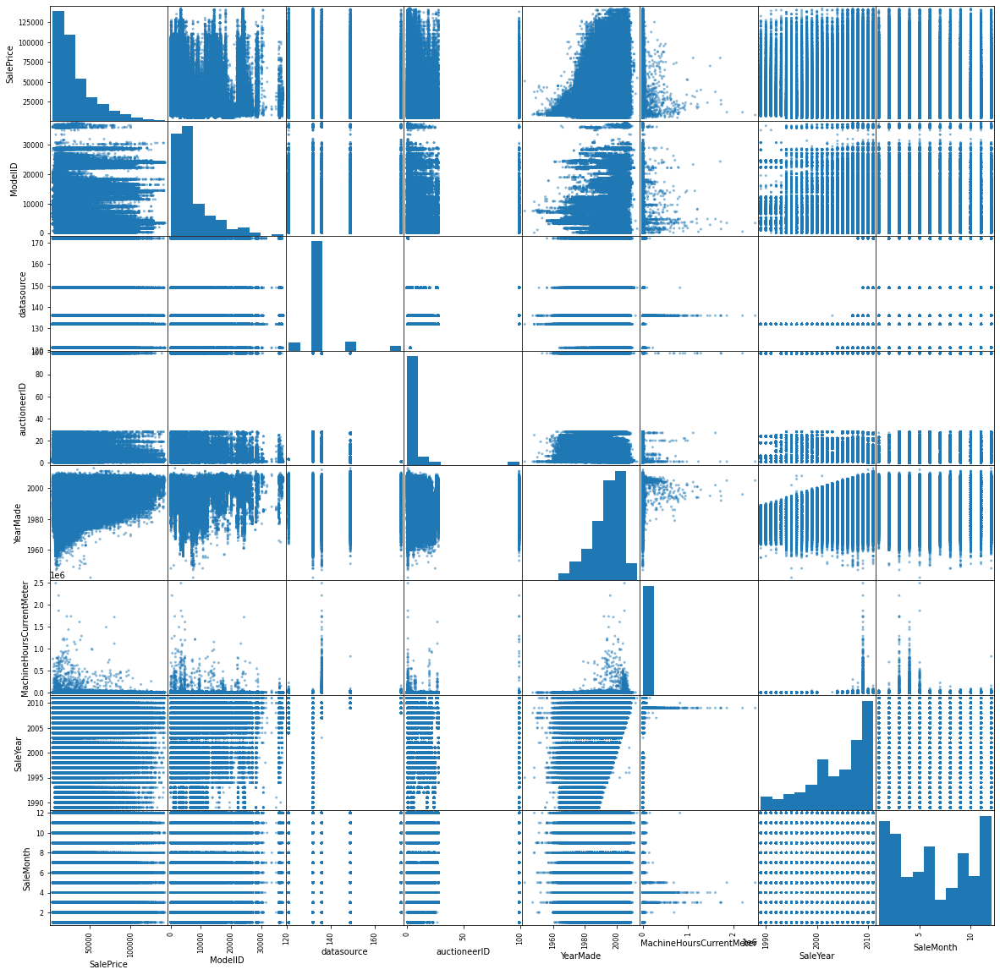

In [154]:
# Redefine num_cols
num_cols = [col for col in df_train.columns if df_train[col].dtype in ['int64','float64']]

pd.plotting.scatter_matrix(df_train[num_cols], figsize=(20,20))

In [155]:
# Distributions
yearmade_cnt = df_train.YearMade.value_counts()
fig = px.bar(x=yearmade_cnt.index
             , y=yearmade_cnt
             , labels={'x': 'Year Made', 'y': 'Count'}
             , width = 600
             , height = 400)
fig.update_traces(width=0.5)
fig.show()


saleprice_cnt = df_train.SalePrice.value_counts()
fig = px.histogram(x=saleprice_cnt.index
             , y=saleprice_cnt
             , nbins=50
             , labels={'x': 'Sale Price', 'y': 'Count'}
)
fig.update_layout(width=600, height=400)
fig.show()

# Scatter plots
fig = px.scatter(df_train
                 , x='YearMade'
                 , y='SalePrice'
                 , width=600
                 , height=400
                 , labels={'x': 'Year Made', 'y': 'Sale Price'}
                 , opacity=0.3
)
fig.show()


## Imputation for numerical columns 

* Impute YearMade column first 
* We are going to take the mode of year made for each model. Then, we will replace NaN YearMade entries with the mode year, 
based on the model name. 


In [156]:
# Get the mode of YearMade for each model
model_mode_year = df_train.groupby('fiBaseModel')['YearMade'].agg(pd.Series.mode)

# Dictionary of {model: YearMade}
model_year_dict = {}

for row in model_mode_year.items():
    if type(row[1]) == np.ndarray:
        if len(row[1]) > 0:
            model_year_dict[row[0]] = row[1][0]
    else:
        model_year_dict[row[0]] = row[1]


df_train['YearMade'] = df_train.apply(
    lambda row: model_year_dict[row['fiBaseModel']] 
        if np.isnan(row['YearMade']) and row['fiBaseModel'] in model_year_dict.keys() else row['YearMade'], axis=1
)

df_valid['YearMade'] = df_valid.apply(
    lambda row: model_year_dict[row['fiBaseModel']] 
        if np.isnan(row['YearMade']) and row['fiBaseModel'] in model_year_dict.keys() else row['YearMade'], axis=1
)

df_test['YearMade'] = df_test.apply(
    lambda row: model_year_dict[row['fiBaseModel']] 
        if np.isnan(row['YearMade']) and row['fiBaseModel'] in model_year_dict.keys() else row['YearMade'], axis=1
)

In [157]:
# There are few rows that don't have YearMade. In this case, just use simple imputer. 
imputer = SimpleImputer(strategy='most_frequent', missing_values=np.nan)
df_train['YearMade'] = imputer.fit_transform(pd.DataFrame(df_train.YearMade))
df_valid['YearMade'] = imputer.transform(pd.DataFrame(df_valid.YearMade))
df_test['YearMade'] = imputer.transform(pd.DataFrame(df_test.YearMade))

# Now that we have complete YearMade column, add a new column 'OwnPeriod'
for df in list_df:
    df = add_own_period(df)

# auctioneerID and MachineHoursCurrentMeter showed almost no correlation with the price. 
imputer = SimpleImputer(strategy='most_frequent', missing_values=np.nan)
imputer.fit(pd.DataFrame(df_train['auctioneerID']))
df_train['auctioneerID'] = imputer.transform(pd.DataFrame(df_train['auctioneerID']))
df_valid['auctioneerID'] = imputer.transform(pd.DataFrame(df_valid['auctioneerID']))
df_test['auctioneerID'] = imputer.transform(pd.DataFrame(df_test['auctioneerID']))

imputer.fit(pd.DataFrame(df_train['MachineHoursCurrentMeter']))
df_train['MachineHoursCurrentMeter'] = imputer.transform(pd.DataFrame(df_train['MachineHoursCurrentMeter']))
df_valid['MachineHoursCurrentMeter'] = imputer.transform(pd.DataFrame(df_valid['MachineHoursCurrentMeter']))
df_test['MachineHoursCurrentMeter'] = imputer.transform(pd.DataFrame(df_test['MachineHoursCurrentMeter']))

Now that encoding for numerical columns is complete, let's move on to categorical columns.

### Now onto categorical features

In [158]:
cat_cols = [col for col in df_train.columns if df_train[col].dtype == 'O']

# Let's see if there are any entries in the df_test that are not in df_train
for cat in cat_cols:
    if len(list(set(df_test[cat].unique()) - set(df_train[cat].unique()))) != 0:
        print(cat, set(df_test[cat].unique()) - set(df_train[cat].unique()), "\n")
        
# There are some entries in the df_test that are not in df_train. 

fiModelDesc {'L180F', 'S650', '840-2', 'CX240LC', '430EST', 'EX450H-3C', 'R55-7A', 'SOLAR 250LCV', '308DCR', '750KWTII', 'K912ALC', '55N2', 'L150F', 'HL720XTD3', 'WB146PS-5', 'ECR145CL', '524K', 'JS460LC', 'TC75', 'E30SR', '307D', 'WA500-6', '1150KLGP', 'ROBOT 165 III', 'ROBEX130W', '850LLT', 'L3400HST', '35SR-3', '544K', '928H', 'EX450LCH', '350BE', 'D475A5', '444K', 'V45A', 'H14', 'SE130W', '650KLGPII', 'L35BPRO', 'HL740XTD3', '1845D', '318D', 'D6M', 'JS300LC', 'PC78US8', 'G170', '8030 ZTS', '319DLN', 'H12B', 'L778', 'R320LC7A', 'PC2306', '850LWT', '840', '315DLC', 'EX130K-5', 'K903-MARK II', 'EH160LC', 'PT80', '324', 'TXL4001', 'EC460CL', 'HD900SEV', '624', '45SR-2', '308C', '215S3', 'PC50US', 'DH220LCIII', '226B3', '721EXR', '763HF', 'D475A3', 'D53S-16', '304DCR', 'D5K2XL', 'TD8ELGP', '430PLUS', 'PT100', '435III', 'WA800-1', 'WA3206', 'R410', '200SRLC'} 

fiBaseModel {'S650', '840-2', 'L778', 'ROBEX130', 'E30', 'ROBOT 165', '524', 'HD900', 'JS300', 'EX130', 'SOLAR 250', 'PT100', 'T

In [159]:
# Cat cols with missing entries
missing_cols = [col for col in cat_cols if df_train[col].isna().sum() != 0]
missing_cols = list(df_train[missing_cols].nunique().index)
len(missing_cols)

36

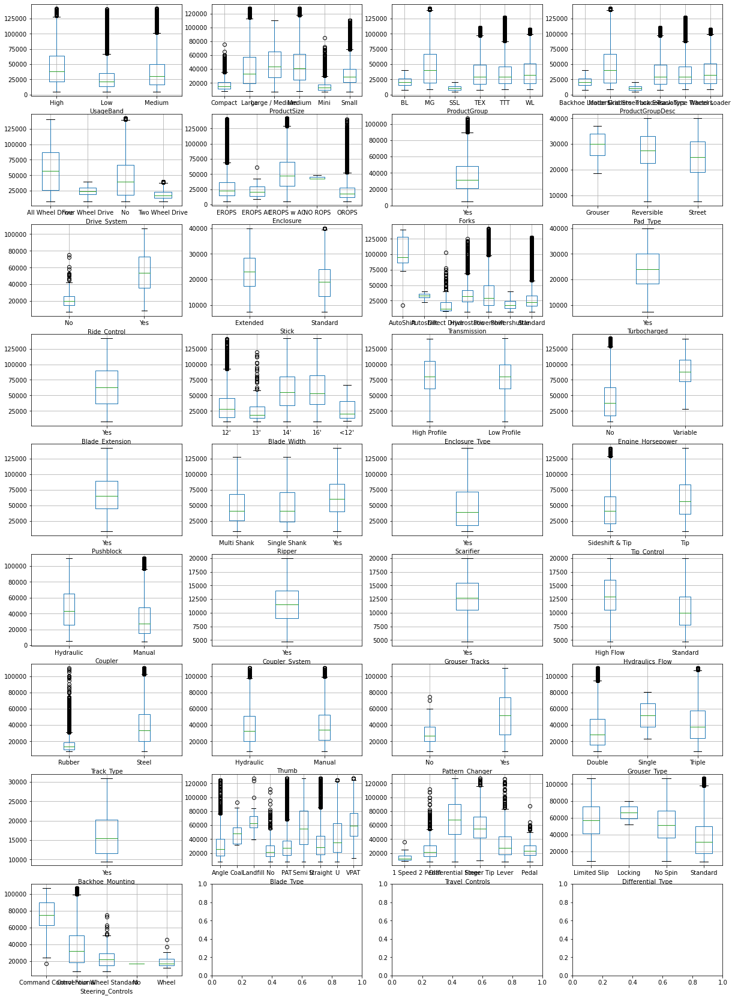

In [160]:
# Cat cols with fewer unique values
few_unique_cols = [col for col in cat_cols if df_train[col].nunique() < 10]

# Subplots 
fig, ax = plt.subplots(9,4, figsize=(20,30))
for i,c in enumerate(few_unique_cols):
    box = df_train.boxplot(column='SalePrice', by=c, ax=ax[int(i/4)][i%4])
    box.set_title("")

plt.suptitle("")
plt.show()

In [161]:
"""
Categorical Columns Handling Missing Values
"""
cat_cols_missing = [col for col in df_train.columns if df_train[col].dtype == 'O' 
     and df_train[col].isna().sum() != 0]

"""
For each categorical columns, group by Model ID to find the most frequent value.
Then, encode the missing entry with the most frequent value with respect to the model.
"""
for col in cat_cols_missing:
    res = df_train.groupby(['ModelID',col]).size()
    res = res.reset_index()
    res = res.iloc[res.groupby(['ModelID'])[0].idxmax().values]
    conv_dict = dict(zip(res['ModelID'], res[col]))    
    for df in list_df:
        df[col] = df.apply(lambda row: conv_dict[row['ModelID']] 
                           if row['ModelID'] in conv_dict.keys() and pd.isnull(row[col])
                           else row[col], axis=1)
    print(col + " complete")

UsageBand complete
fiSecondaryDesc complete
ProductSize complete
Drive_System complete
Enclosure complete
Forks complete
Pad_Type complete
Ride_Control complete
Stick complete
Transmission complete
Turbocharged complete
Blade_Extension complete
Blade_Width complete
Enclosure_Type complete
Engine_Horsepower complete
Hydraulics complete
Pushblock complete
Ripper complete
Scarifier complete
Tip_Control complete
Tire_Size complete
Coupler complete
Coupler_System complete
Grouser_Tracks complete
Hydraulics_Flow complete
Track_Type complete
Undercarriage_Pad_Width complete
Stick_Length complete
Thumb complete
Pattern_Changer complete
Grouser_Type complete
Backhoe_Mounting complete
Blade_Type complete
Travel_Controls complete
Differential_Type complete
Steering_Controls complete


In [162]:
display(df_train.isna().sum()/len(df_train))
display(df_valid.isna().sum()/len(df_valid))
display(df_test.isna().sum()/len(df_test))

SalePrice                   0.000000
ModelID                     0.000000
datasource                  0.000000
auctioneerID                0.000000
YearMade                    0.000000
MachineHoursCurrentMeter    0.000000
UsageBand                   0.028654
fiModelDesc                 0.000000
fiBaseModel                 0.000000
fiSecondaryDesc             0.342016
ProductSize                 0.525460
fiProductClassDesc          0.000000
state                       0.000000
ProductGroup                0.000000
ProductGroupDesc            0.000000
Drive_System                0.738515
Enclosure                   0.000002
Forks                       0.560533
Pad_Type                    0.833254
Ride_Control                0.700467
Stick                       0.802019
Transmission                0.540248
Turbocharged                0.830731
Blade_Extension             0.947627
Blade_Width                 0.936942
Enclosure_Type              0.947597
Engine_Horsepower           0.936496
H

ModelID                     0.000000
datasource                  0.000000
auctioneerID                0.000000
YearMade                    0.000000
MachineHoursCurrentMeter    0.000000
UsageBand                   0.016850
fiModelDesc                 0.000000
fiBaseModel                 0.000000
fiSecondaryDesc             0.305539
ProductSize                 0.503759
fiProductClassDesc          0.000000
state                       0.000000
ProductGroup                0.000000
ProductGroupDesc            0.000000
Drive_System                0.761946
Enclosure                   0.000000
Forks                       0.554912
Pad_Type                    0.854402
Ride_Control                0.686944
Stick                       0.828394
Transmission                0.589130
Turbocharged                0.865549
Blade_Extension             0.949192
Blade_Width                 0.934503
Enclosure_Type              0.945736
Engine_Horsepower           0.933552
Hydraulics                  0.171606
P

ModelID                     0.000000
datasource                  0.000000
auctioneerID                0.000000
YearMade                    0.000000
MachineHoursCurrentMeter    0.000000
UsageBand                   0.019347
fiModelDesc                 0.000000
fiBaseModel                 0.000000
fiSecondaryDesc             0.319098
ProductSize                 0.514490
fiProductClassDesc          0.000000
state                       0.000000
ProductGroup                0.000000
ProductGroupDesc            0.000000
Drive_System                0.777555
Enclosure                   0.000000
Forks                       0.535763
Pad_Type                    0.853817
Ride_Control                0.704022
Stick                       0.829895
Transmission                0.614594
Turbocharged                0.863129
Blade_Extension             0.959300
Blade_Width                 0.948463
Enclosure_Type              0.955366
Engine_Horsepower           0.947660
Hydraulics                  0.170185
P

Still seeing a lot of missing entries. It must be that only certain models provide these informations. In fact, it's possible that these features are missing as they do not pertain to some models. In such case, it may be better if we categorize them as "other".

In [163]:
for df in list_df:
    df.fillna("other", inplace=True)

# No more missing entries
for df in list_df:
    assert(df.isna().sum().any() == 0)

## Categorical Columns Encoding
* Use one-hot encoder for categorical columns with fewer than 5 unique values
* Use Target Encoder otherwise




In [164]:
# Separate features and target
X_train = df_train.drop('SalePrice', axis=1)
y_train = df_train.SalePrice
X_valid = df_valid.copy()
y_valid = pd.read_csv('ValidSolution.csv').SalePrice
X_test = df_test.copy()

In [165]:
cat_cols_small = [col for col in cat_cols if X_train[col].nunique() < 5]  # Categorical columns with small # of unique values
cat_cols_large = [col for col in cat_cols if X_train[col].nunique() >= 5]  # Categorical columns with large # of unique values

# One Hot Encoding for cat_cols_small
enc = OneHotEncoder(handle_unknown='ignore')
encoded = pd.DataFrame(enc.fit_transform(X_train[cat_cols_small]).toarray())
encoded.columns = enc.get_feature_names_out()
X_train = pd.concat([X_train, encoded], axis=1)
X_train.drop(cat_cols_small, axis=1, inplace=True)

# Now encode valid and test X
encoded = pd.DataFrame(enc.transform(X_valid[cat_cols_small]).toarray())
encoded.columns = enc.get_feature_names_out()
X_valid = pd.concat([X_valid, encoded], axis=1)
X_valid.drop(cat_cols_small, axis=1, inplace=True)

encoded = pd.DataFrame(enc.transform(X_test[cat_cols_small]).toarray())
encoded.columns = enc.get_feature_names_out()
X_test = pd.concat([X_test, encoded], axis=1)
X_test.drop(cat_cols_small, axis=1, inplace=True)

# All same number of columns 
assert(X_train.shape[1] == X_valid.shape[1] == X_test.shape[1])

In [166]:
# Now target encode columns with more than 5 unique values 
enc = ce.target_encoder.TargetEncoder(return_df=True, handle_unknown='value')
X_train[cat_cols_large] = enc.fit_transform(X_train[cat_cols_large], y_train)
X_valid[cat_cols_large] = enc.transform(X_valid[cat_cols_large])
X_test[cat_cols_large] = enc.transform(X_valid[cat_cols_large])


In [167]:
# Drop unnecessary numerical columns 
X_train.drop(['ModelID','datasource'], axis=1, inplace=True)
X_valid.drop(['ModelID','datasource'], axis=1, inplace=True)
X_test.drop(['ModelID','datasource'], axis=1, inplace=True)

In [168]:
#Make sure all values in columns are not object type
assert(X_train.dtypes.values.all() == 'float64')
assert(X_valid.dtypes.values.all() == 'float64')
assert(X_test.dtypes.values.all() == 'float64')

## Normalization
* Use Standard Scaler

In [169]:
"""
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train))
X_train_scaled.columns = X_train.columns
X_train = X_train_scaled

X_valid_scaled = pd.DataFrame(scaler.transform(X_valid))
X_valid_scaled.columns = X_valid.columns
X_valid = X_valid_scaled

X_test_scaled = pd.DataFrame(scaler.transform(X_test))
X_test_scaled.columns = X_test.columns
X_test = X_test_scaled
"""

'\nscaler = StandardScaler()\nX_train_scaled = pd.DataFrame(scaler.fit_transform(X_train))\nX_train_scaled.columns = X_train.columns\nX_train = X_train_scaled\n\nX_valid_scaled = pd.DataFrame(scaler.transform(X_valid))\nX_valid_scaled.columns = X_valid.columns\nX_valid = X_valid_scaled\n\nX_test_scaled = pd.DataFrame(scaler.transform(X_test))\nX_test_scaled.columns = X_test.columns\nX_test = X_test_scaled\n'

## Modeling
* XGB regressor
* Random Forest regressor

#### Let's define custom scoring function for Root Mean Square Logarithmic Error(RMSLE)

In [170]:
def rmsle(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred) 
    log_diff = (np.log(y_true + 1) - np.log(y_pred + 1))**2
    
    return np.sqrt(np.sum(log_diff)/len(y_true)) 

# Make scorer
score = make_scorer(rmsle)

In [171]:
# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=50, min_samples_split=4, n_jobs=-1, random_state=42)
rf.fit(X_train, y_train)
pred_val = rf.predict(X_valid)
print("Random Forest Regressor Model - Validation set RMSLE: ", rmsle(y_valid, pred_val))

Random Forest Regressor Model - Validation set RMSLE:  0.23935960292274738


In [172]:
feature_dict = dict(zip(rf.feature_names_in_,rf.feature_importances_.round(4)))

# Show feature importances 
print(sorted(feature_dict.items(), key=lambda x:x[1], reverse=True))

[('fiModelDesc', 0.7603), ('OwnPeriod', 0.0649), ('SaleYear', 0.0498), ('YearMade', 0.02), ('SaleMonth', 0.016), ('state', 0.0155), ('fiBaseModel', 0.009), ('fiProductClassDesc', 0.0082), ('auctioneerID', 0.0074), ('Enclosure', 0.0063), ('MachineHoursCurrentMeter', 0.0048), ('fiSecondaryDesc', 0.004), ('Undercarriage_Pad_Width', 0.0035), ('Stick_Length', 0.0027), ('Tire_Size', 0.0026), ('ProductSize', 0.0023), ('Hydraulics', 0.0023), ('Blade_Type', 0.0018), ('UsageBand_Low', 0.0012), ('Transmission', 0.0011), ('UsageBand_Medium', 0.001), ('Travel_Controls', 0.0009), ('Drive_System', 0.0008), ('Ripper_Multi Shank', 0.0007), ('Ripper_Single Shank', 0.0007), ('Ripper_other', 0.0007), ('UsageBand_High', 0.0006), ('Coupler_Manual', 0.0006), ('Thumb_Manual', 0.0006), ('Grouser_Type_Double', 0.0006), ('ProductGroup', 0.0005), ('ProductGroupDesc', 0.0005), ('Blade_Width', 0.0005), ('UsageBand_other', 0.0005), ('Coupler_Hydraulic', 0.0005), ('Thumb_Hydraulic', 0.0005), ('Grouser_Type_Triple', 0

In [ ]:
# XGB Regressor
xgb = XGBRegressor(n_estimators=100, learning_rate=0.2, n_jobs=-1, random_state=42, scoring=score)
xgb.fit(X_train, y_train)
pred_val = xgb.predict(X_valid)
print("XGB Regressor Model validation set RMSLE: ", rmsle(y_valid, pred_val))

Let's try Grid Search

In [ ]:
"""
# XGB regressor 
xgb = XGBRegressor()
params = {'n_estimators':[10,20,50], 'max_depth':[10,20,50], 'learning_rate':[0.01,0.05,0.1]}

reg = RandomizedSearchCV(xgb, params, n_iter=20, cv=5, scoring=score, n_jobs=-1, verbose=3)
reg.fit(X_train, y_train)
"""

In [ ]:
"""
# Random Forest Regressor 
rf = RandomForestRegressor()
params = {'n_estimators':[20,50,100], 'min_samples_split':[2,3,4]}

reg = RandomizedSearchCV(rf, params, n_iter=5, cv=5, scoring=score, n_jobs=-1, verbose=10)
reg.fit(X_train, y_train)
"""